## Clone Repo

In [1]:
import os

# if running on collaboratory set = True
collaboratory = False

if collaboratory:
    from google.colab import drive
    drive.mount('/content/drive')

    # changes directory to your main google drive folder
    %cd drive/My\ Drive

    # Checks if the directory exists
    if os.path.exists("./Rapid-Fitting-of-BEPFM-and-Hysteresis-Loops-Using-Physics-Constrained-Unsupervised-Neural-Networks"):
        pass
    else:
        !git clone https://github.com/abekek/Rapid-Fitting-of-BEPFM-and-Hysteresis-Loops-Using-Physics-Constrained-Unsupervised-Neural-Networks.git
    # moves to the right directory
    %cd Rapid-Fitting-of-BEPFM-and-Hysteresis-Loops-Using-Physics-Constrained-Unsupervised-Neural-Networks
else: 
    print('Running on local systems, if running on collaboratory please change above')

Running on local systems, if running on collaboratory please change above


In [2]:
# checks if the directory is up to date
!git pull

There is no tracking information for the current branch.
Please specify which branch you want to merge with.
See git-pull(1) for details.

    git pull <remote> <branch>

If you wish to set tracking information for this branch you can do so with:

    git branch --set-upstream-to=origin/<branch> master



## Installation & Import

In [3]:
# Installs all of the requirements
if collaboratory:
    !pip install -r requirements.txt
else:
    !pip install -r ../../requirements.txt

  Using cached attrs-20.3.0-py2.py3-none-any.whl (49 kB)
  Using cached autopep8-1.5.4.tar.gz (121 kB)
  Using cached certifi-2020.12.5-py2.py3-none-any.whl (147 kB)
  Using cached coverage-5.3.1-cp39-cp39-manylinux2010_x86_64.whl (244 kB)
  Using cached docopt-0.6.2.tar.gz (25 kB)
  Using cached idna-2.10-py2.py3-none-any.whl (58 kB)
  Using cached numpy-1.19.5-cp39-cp39-manylinux2010_x86_64.whl (14.9 MB)
  Using cached packaging-20.8-py2.py3-none-any.whl (39 kB)
  Using cached Pillow-8.1.0-cp39-cp39-manylinux1_x86_64.whl (2.2 MB)
  Using cached pipreqs-0.4.10-py2.py3-none-any.whl (25 kB)
  Using cached pluggy-0.13.1-py2.py3-none-any.whl (18 kB)
  Using cached py-1.10.0-py2.py3-none-any.whl (97 kB)
  Using cached pycodestyle-2.6.0-py2.py3-none-any.whl (41 kB)
  Using cached pyparsing-2.4.7-py2.py3-none-any.whl (67 kB)
  Using cached pytest-6.2.1-py3-none-any.whl (279 kB)
  Using cached pytest_cov-2.11.1-py2.py3-none-any.whl (20 kB)
  Using cached requests-2.25.1-py2.py3-none-any.whl (

In [4]:
# installing PyTorch's Nightly version
!pip install --pre torch torchvision -f https://download.pytorch.org/whl/nightly/cu101/torch_nightly.html -U

!pip install pycroscopy==0.60.7

if os.path.exists("./BGlib"):
    pass
else:
    !git clone https://github.com/pycroscopy/BGlib.git
    %cd BGlib/
    !git tag -l
    !git checkout 0.0.3
    !git branch -D master
    !git checkout -b master
    %cd ..

# downgrading the h5py version
!pip install 'h5py==2.10.0' --force-reinstal

Looking in links: https://download.pytorch.org/whl/nightly/cu101/torch_nightly.html
Cloning into 'BGlib'...
remote: Enumerating objects: 2165, done.
remote: Counting objects: 100% (670/670), done.
remote: Compressing objects: 100% (157/157), done.
remote: Total 2165 (delta 522), reused 637 (delta 508), pack-reused 1495
Receiving objects: 100% (2165/2165), 11.79 MiB | 51.80 MiB/s, done.
Resolving deltas: 100% (1372/1372), done.
/home/ferroelectric/Desktop/Alibek/Paper/Rapid-Fitting-of-BEPFM-and-Hysteresis-Loops-Using-Physics-Constrained-Unsupervised-Neural-Networks/notebooks/quantization/BGlib
0.0.2
0.0.3
v0.0.0
v0.0.1
v0.0.3
Note: switching to '0.0.3'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch 

In [5]:
!pip install hls4ml
!pip install numba
!pip install moviepy
!pip install qkeras
!pip install hls4ml[profiling]

  Using cached numpy-1.22.4-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.1
    Uninstalling numpy-1.23.1:
      Successfully uninstalled numpy-1.23.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
daal4py 2021.5.0 requires daal==2021.4.0, which is not installed.
numba 0.55.1 requires numpy<1.22,>=1.18, but you have numpy 1.22.4 which is incompatible.
  Using cached numpy-1.21.6-cp39-cp39-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (15.7 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
da

In [9]:
import gdown
import multiprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from numba import jit
import random
import time
import torch
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim.lr_scheduler as lr_scheduler
import argparse
import seaborn as sns
from scipy.signal import resample
from scipy import fftpack
from scipy import io
from scipy import special
import tensorflow as tf
import tensorflow.keras.backend as K
import tensorflow.keras.layers as layers
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.layers import (Attention, Dense, Conv1D, Convolution2D, 
                                     GRU, LSTM, Bidirectional, TimeDistributed,
                                     Dropout, Flatten, LayerNormalization, 
                                     RepeatVector, Reshape, MaxPooling1D, 
                                     UpSampling1D, BatchNormalization, Activation)
from tensorflow.keras.layers import Layer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Reshape
from tensorflow.keras.layers import BatchNormalization, Conv1D, MaxPooling1D
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.regularizers import l1, l2
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint
from multiprocessing import Pool, Process
import multiprocessing as mp
from moviepy.editor import *
import glob
from sklearn.metrics import mean_squared_error
import gc
import sidpy
from BGlib.BGlib import be as belib
 
# set up notebook to show plots within the notebook
%matplotlib inline
import matplotlib.image as mpimg
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from matplotlib.patches import ConnectionPatch

# Import necessary libraries:
# General utilities:
import sys
import os
import gc

# Computation:
import numpy as np
import h5py
import pandas as pd

# Visualization:
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display
from IPython.display import Image
from IPython.display import clear_output
from mpl_toolkits.axes_grid1 import ImageGrid

# Finally, pycroscopy itself
sys.path.append('../../../')
import pyUSID as usid
sys.path.append('../../')
from codes.util.preprocessing_global_standard_scaler import global_standard_scaler
from sidpy.hdf.hdf_utils import write_simple_attrs, get_attr
from pyUSID.io.hdf_utils import create_results_group, write_main_dataset, write_reduced_anc_dsets, create_empty_dataset, reshape_to_n_dims, get_auxiliary_datasets
from pyUSID.io.usi_data import USIDataset
from pyUSID.io import Dimension

from codes.util.file import print_tree
from codes.util.core import SHO_fit_func_torch, loop_fitting_function, loop_fitting_function_tf, computeDotProducts, normOfVar, fit_loop_function, computeTime, conventional_fit_loop_function
from codes.viz.plot import plot_best_worst_SHO, make_movie, plot_best_worst_loops, plot_reconstruction_comparison_SHO, plot_reconstruction_comparison_loops
from codes.util.postprocessing import transform_params, convert_real_imag
from codes.util.preprocessing_global_scaler import global_scaler
from codes.processing.filters import range_filter, clean_interpolate, interpolate_missing_points
from codes.algorithm.TRPCGOptimizerv2 import TRPCGOptimizerv2
from codes.algorithm.AdaHessian import AdaHessian

import numpy.lib.recfunctions as rfn

import hls4ml
import tensorflow as tf
import keras
from tensorflow.keras import datasets, layers, models
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv1D, Activation, MaxPool1D, AvgPool1D, Flatten, Dense
from tensorflow.nn import selu
from qkeras import *
from qkeras.utils import _add_supported_quantized_objects
from tensorflow_model_optimization.sparsity.keras import strip_pruning
from tensorflow_model_optimization.python.core.sparsity.keras import pruning_wrapper

## Setting defaults

In [12]:
# shows the number of CPU cores
multiprocessing.cpu_count()

48

In [13]:
# shows the GPU that is available and the resources
!nvidia-smi

Mon Jul 25 12:31:09 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.129.06   Driver Version: 470.129.06   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:01:00.0  On |                  N/A |
|  0%   42C    P8    21W / 370W |    247MiB / 24260MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [14]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
gpus

2022-07-25 12:31:12.632603: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 12:31:12.635575: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 12:31:12.636254: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [15]:
# fixes the random seed for reproducible training
torch.set_default_dtype(torch.float32)
torch.manual_seed(42)
np.random.seed(42)

In [16]:
# resetting default seaborn style
sns.reset_orig()

# setting default plotting params
plt.rcParams['image.cmap'] = 'magma'
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True

## Loading data

In [18]:
gdown.download('https://drive.google.com/uc?export=download&id=1Q2Qo_1VGlCsVOTjQpZlE5tjoIV1etVe2', 'data_file_copy.h5', quiet=False)

Downloading...
From: https://drive.google.com/uc?export=download&id=1Q2Qo_1VGlCsVOTjQpZlE5tjoIV1etVe2
To: /home/ferroelectric/Desktop/Alibek/Paper/Rapid-Fitting-of-BEPFM-and-Hysteresis-Loops-Using-Physics-Constrained-Unsupervised-Neural-Networks/notebooks/quantization/data_file_copy.h5

  0%|                                                                                       | 0.00/1.80G [00:00<?, ?B/s]
  0%|▏                                                                             | 4.19M/1.80G [00:00<00:44, 40.4MB/s]
  1%|▋                                                                             | 16.3M/1.80G [00:00<00:20, 85.3MB/s]
  2%|█▏                                                                            | 28.3M/1.80G [00:00<00:17, 99.7MB/s]
  2%|█▋                                                                            | 38.8M/1.80G [00:00<00:17, 99.8MB/s]
  3%|██▏                                                                            | 50.3M/1.80G [00:00<00

'data_file_copy.h5'

In [19]:
# Opens the translated file
h5_f = h5py.File('./data_file_copy.h5', 'r+')

#Inspects the h5 file
usid.hdf_utils.print_tree(h5_f)

/
├ Measurement_000
  ---------------
  ├ Channel_000
    -----------
    ├ Bin_FFT
    ├ Bin_Frequencies
    ├ Bin_Indices
    ├ Bin_Step
    ├ Bin_Wfm_Type
    ├ Excitation_Waveform
    ├ Noise_Floor
    ├ Position_Indices
    ├ Position_Values
    ├ Raw_Data
    ├ Raw_Data-SHO_Fit_000
      --------------------
      ├ Fit
      ├ Guess
      ├ Spectroscopic_Indices
      ├ Spectroscopic_Values
      ├ completed_fit_positions
      ├ completed_guess_positions
    ├ Spatially_Averaged_Plot_Group_000
      ---------------------------------
      ├ Bin_Frequencies
      ├ Max_Response
      ├ Mean_Spectrogram
      ├ Min_Response
      ├ Spectroscopic_Parameter
      ├ Step_Averaged_Response
    ├ Spatially_Averaged_Plot_Group_001
      ---------------------------------
      ├ Bin_Frequencies
      ├ Max_Response
      ├ Mean_Spectrogram
      ├ Min_Response
      ├ Spectroscopic_Parameter
      ├ Step_Averaged_Response
    ├ Spectroscopic_Indices
    ├ Spectroscopic_Values
    ├ UDVS

In [20]:
print('Datasets and datagroups within the file:\n------------------------------------')
print_tree(h5_f.file)
 
print('\nThe main dataset:\n------------------------------------')
print(h5_f)
print('\nThe ancillary datasets:\n------------------------------------')
print(h5_f.file['/Measurement_000/Channel_000/Position_Indices'])
print(h5_f.file['/Measurement_000/Channel_000/Position_Values'])
print(h5_f.file['/Measurement_000/Channel_000/Spectroscopic_Indices'])
print(h5_f.file['/Measurement_000/Channel_000/Spectroscopic_Values'])

print('\nMetadata or attributes in a datagroup\n------------------------------------')
for key in h5_f.file['/Measurement_000'].attrs:
    print('{} : {}'.format(key, h5_f.file['/Measurement_000'].attrs[key]))

Datasets and datagroups within the file:
------------------------------------
/
/Measurement_000
/Measurement_000/Channel_000
/Measurement_000/Channel_000/Bin_FFT
/Measurement_000/Channel_000/Bin_Frequencies
/Measurement_000/Channel_000/Bin_Indices
/Measurement_000/Channel_000/Bin_Step
/Measurement_000/Channel_000/Bin_Wfm_Type
/Measurement_000/Channel_000/Excitation_Waveform
/Measurement_000/Channel_000/Noise_Floor
/Measurement_000/Channel_000/Position_Indices
/Measurement_000/Channel_000/Position_Values
/Measurement_000/Channel_000/Raw_Data
/Measurement_000/Channel_000/Raw_Data-SHO_Fit_000
/Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Fit
/Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Guess
/Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Spectroscopic_Indices
/Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Spectroscopic_Values
/Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/completed_fit_positions
/Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/completed_guess_positions

In [21]:
# number of samples per SHO fit
num_bins = h5_f['Measurement_000'].attrs['num_bins'] 

# number of pixels in the image
num_pix = h5_f['Measurement_000'].attrs['num_pix'] 

# number of pixels in x and y dimensions
num_pix_1d = int(np.sqrt(num_pix)) 

# number of DC voltage steps 
voltage_steps = h5_f['Measurement_000'].attrs['num_udvs_steps']

# sampling rate
sampling_rate = h5_f['Measurement_000'].attrs['IO_rate_[Hz]']

# BE bandwidth
be_bandwidth = h5_f['Measurement_000'].attrs['BE_band_width_[Hz]']

# BE center frequency
be_center_frequency = h5_f['Measurement_000'].attrs['BE_center_frequency_[Hz]']

# Frequency Vector in Hz
frequency_bin = h5_f['Measurement_000']['Channel_000']['Bin_Frequencies'][:]

# Resampled frequency vector
wvec_freq = resample(frequency_bin, 80)

In [22]:
# get raw data (real and imaginary combined)
raw_data = h5_f['Measurement_000']['Channel_000']['Raw_Data']
# resampling it from 165 to 80 frequency steps
raw_data_resampled = resample(np.array(raw_data).reshape(-1 , 165), 80, axis=1)

## Conversion of Real/Imaginary to Magnitude/Phase Representation

In [23]:
# conversion of raw data (both resampled and full)
magnitude_graph_initial_full, phase_graph_initial_full = convert_real_imag(raw_data)
magnitude_graph_initial, phase_graph_initial = convert_real_imag(raw_data_resampled)

## Resampling the data

In [24]:
# get real and imaginary components from raw data
real = np.real(h5_f['Measurement_000']['Channel_000']['Raw_Data'])
imag = np.imag(h5_f['Measurement_000']['Channel_000']['Raw_Data'])

# resample both real and imaginary components 
real_resample = resample(real.reshape(num_pix, -1, num_bins), 80, axis=2)
imag_resample = resample(imag.reshape(num_pix, -1, num_bins), 80, axis=2)

In [25]:
# free up the RAM
del real
del imag
gc.collect();

### Params

In [26]:
# create a list for parameters
fit_results_list = []
for sublist in np.array(h5_f['Measurement_000']['Channel_000']['Raw_Data-SHO_Fit_000']['Fit']):
    for item in sublist:
        for i in item:
          fit_results_list.append(i)

# flatten parameters list into numpy array
fit_results_list = np.array(fit_results_list).reshape(num_pix,voltage_steps,5)

In [27]:
# scale the fit results with Standard Scaler
fit_results_scaler = StandardScaler()
scaled_fit_results = fit_results_scaler.fit_transform(fit_results_list.reshape(-1,5))

### Scaler

In [28]:
# scale the real component of input data
scaler_real = global_standard_scaler()
scaled_data_real = scaler_real.fit_transform(real_resample).reshape(-1, 80)

# scale the imaginary component of input data
scaler_imag = global_standard_scaler()
scaled_data_imag = scaler_imag.fit_transform(imag_resample).reshape(-1, 80)

# stack both components
data_ = np.stack((scaled_data_real, scaled_data_imag),axis=2)

# scale the parameters (now takes only 4 parameters, excluding the R2)
params_scaler = StandardScaler()
scaled_params = params_scaler.fit_transform(fit_results_list.reshape(-1,5)[:,0:4])

# exclude the R2 parameter
params = fit_results_list.reshape(-1,5)[:,0:4]
print(params.shape)

del real_resample
del imag_resample

mean =  -6.855169e-06 STD =  0.0026878386
mean =  0.00013161483 STD =  0.0027575183
(1382400, 4)


### Train/Test Split

In [29]:
data_train, data_test, params_train, params_test = train_test_split(data_, 
                                                                    params, 
                                                                    test_size=0.2,
                                                                    random_state=42)

## Tensorflow/HLS4ML Model

In [30]:
tf.keras.backend.set_floatx('float32')

### Custom Loss Function

In [31]:
def SHO_fitting_function(params):
    amp = tf.expand_dims(params[:, 0], 1)
    w_0 = tf.expand_dims(params[:, 1], 1)
    qf  = tf.expand_dims(params[:, 2], 1)
    phi = tf.expand_dims(params[:, 3], 1)
    
    amp = tf.cast(amp, tf.complex128)
    w_0 = tf.cast(w_0, tf.complex128)
    qf = tf.cast(qf, tf.complex128)
    phi = tf.cast(phi, tf.complex128)
    frequency = tf.cast(wvec_freq, tf.complex128)
    
    numer = amp * tf.math.exp((1.j) * phi) * tf.math.square(w_0)
    den_1 = tf.math.square(frequency)
    den_2 = (1.j) * frequency * w_0 / qf
    den_3 = tf.math.square(w_0)
    
    den = den_1 - den_2 - den_3
    func = numer / den
    
    real = tf.math.real(func)
    real_scaled = tf.divide(tf.subtract(tf.cast(real, tf.float32), \
                            tf.convert_to_tensor(scaler_real.mean, dtype=tf.float32)),\
                             tf.convert_to_tensor(scaler_real.std, dtype=tf.float32))
    
    imag = tf.math.imag(func)
    imag_scaled = tf.divide(tf.subtract(tf.cast(imag, tf.complex128), \
                        tf.convert_to_tensor(scaler_imag.mean, dtype=tf.complex128)),\
                          tf.convert_to_tensor(scaler_imag.std, dtype=tf.complex128))
    
    func = tf.stack((real_scaled, tf.cast(imag_scaled, tf.float32)), axis=2)
    return func

In [32]:
def custom_loss(y_true, y_pred):
    y_true = SHO_fitting_function(y_true)
    unscaled_params = y_pred * tf.convert_to_tensor(np.sqrt(params_scaler.var_[0:4]), dtype=tf.float32) + tf.convert_to_tensor(params_scaler.mean_[0:4], dtype=tf.float32)
    y_pred = SHO_fitting_function(unscaled_params)
    mse = tf.math.square(y_true-y_pred)
    return tf.reduce_mean(mse, axis=-1)

### Original Model

In [33]:
def Conv1D_Block(x, time_step, kernel_size):
    x = Conv1D(time_step, kernel_size, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation(selu)(x)
    return x

def SHO_Model(n_step=80):
    original_input = tf.keras.Input(shape=(n_step, 2))
    x = Conv1D_Block(original_input, 8, 7)
    x = Conv1D_Block(x, 6, 7)
    x = Conv1D_Block(x, 4, 5)
    
    xfc = Flatten()(x)
    xfc = Dense(20, selu)(xfc)
    xfc = Dense(20, selu)(xfc)
    
    x = MaxPool1D(2, padding='same')(x)
    x = Conv1D_Block(x, 2, 5)
    x = Conv1D_Block(x, 4, 5)
    x = Conv1D_Block(x, 4, 5)
    x = Conv1D_Block(x, 4, 5)
    x = Conv1D_Block(x, 4, 5)
    x = Conv1D_Block(x, 4, 5)
    x = AvgPool1D(2, padding='same')(x)
    x = Conv1D_Block(x, 4, 3)
    x = AvgPool1D(2, padding='same')(x)
    x = Conv1D_Block(x, 4, 3)
    x = AvgPool1D(2, padding='same')(x)
    
    cnn_flat = Flatten()(x)
    encoded = tf.concat([cnn_flat, xfc], 1)
    encoded = tf.keras.layers.concatenate([cnn_flat, xfc], 1)
    embedding = Dense(16, selu)(encoded)
    embedding = Dense(8, selu)(embedding)
    embedding = Dense(4, selu)(embedding)
    
    model = Model(original_input, embedding, name='SHO_Model')
    return model

In [34]:
train_dataset = tf.data.Dataset.from_tensor_slices((data_train, params_train))
test_dataset = tf.data.Dataset.from_tensor_slices((data_test, params_test))
BATCH_SIZE = 256
SHUFFLE_BUFFER_SIZE = 512
train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

2022-07-25 12:33:43.382073: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-07-25 12:33:43.385478: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 12:33:43.386816: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 12:33:43.388072: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zer

In [35]:
model = SHO_Model()
sgd = SGD()
model.compile(optimizer=sgd, loss=custom_loss)

In [36]:
model.summary()

Model: "SHO_Model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 80, 2)]      0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 80, 8)        120         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 80, 8)       32          ['conv1d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 activation (Activation)        (None, 80, 8)        0           ['batch_normalization[0][

In [37]:
for layer in model.layers:
    if layer.__class__.__name__ in ['Conv1D', 'Dense']:
        w = layer.get_weights()[0]
        layersize = np.prod(w.shape)
        print("{}: {}".format(layer.name,layersize)) # 0 = weights, 1 = biases
        if (layersize > 4096): # assuming that shape[0] is batch, i.e., 'None'
            print("Layer {} is too large ({}), are you sure you want to train?".format(layer.name,layersize))

conv1d: 112
conv1d_1: 336
conv1d_2: 120
conv1d_3: 40
conv1d_4: 40
conv1d_5: 80
conv1d_6: 80
conv1d_7: 80
conv1d_8: 80
conv1d_9: 48
conv1d_10: 48
dense: 6400
Layer dense is too large (6400), are you sure you want to train?
dense_1: 400
dense_2: 640
dense_3: 128
dense_4: 32


In [38]:
model.fit(train_dataset, epochs=15, batch_size=BATCH_SIZE)

Epoch 1/15


2022-07-25 12:34:02.261178: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8302
2022-07-25 12:34:03.675287: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


4320/4320 [==============================] - 61s 13ms/step - loss: 0.0642
Epoch 2/15
4320/4320 [==============================] - 57s 13ms/step - loss: 0.0115
Epoch 3/15
4320/4320 [==============================] - 57s 13ms/step - loss: 0.0088
Epoch 4/15
4320/4320 [==============================] - 56s 13ms/step - loss: 0.0076
Epoch 5/15
4320/4320 [==============================] - 57s 13ms/step - loss: 0.0068
Epoch 6/15
4320/4320 [==============================] - 57s 13ms/step - loss: 0.0064
Epoch 7/15
4320/4320 [==============================] - 57s 13ms/step - loss: 0.0061
Epoch 8/15
4320/4320 [==============================] - 57s 13ms/step - loss: 0.0058
Epoch 9/15
4320/4320 [==============================] - 57s 13ms/step - loss: 0.0056
Epoch 10/15
4320/4320 [==============================] - 57s 13ms/step - loss: 0.0055
Epoch 11/15
4320/4320 [==============================] - 58s 13ms/step - loss: 0.0053
Epoch 12/15
4320/4320 [==============================] - 57s 13ms/step - l

In [40]:
model.save('../../Trained Models/Quantization/tf_sho_model')
model.save('../../Trained Models/Quantization/tf_sho_model.h5')

INFO:tensorflow:Assets written to: ../../Trained Models/Quantization/tf_sho_model/assets


INFO:tensorflow:Assets written to: ../../Trained Models/Quantization/tf_sho_model/assets


In [41]:
new_model = tf.keras.models.load_model('../../Trained Models/Quantization/tf_sho_model.h5', compile=False)
new_model.compile(loss=custom_loss, optimizer=sgd)
new_model.summary()

Model: "SHO_Model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 80, 2)]      0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 80, 8)        120         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 80, 8)       32          ['conv1d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 activation (Activation)        (None, 80, 8)        0           ['batch_normalization[0][

### Converting to HLS Model

In [42]:
config = hls4ml.utils.config_from_keras_model(new_model, granularity='name')

Interpreting Model
Topology:
Layer name: input_1, layer type: Input
Layer name: conv1d, layer type: Conv1D
  -> Activation (linear), layer name: conv1d
Layer name: batch_normalization, layer type: BatchNormalization
Layer name: activation, layer type: Activation
Layer name: conv1d_1, layer type: Conv1D
  -> Activation (linear), layer name: conv1d_1
Layer name: batch_normalization_1, layer type: BatchNormalization
Layer name: activation_1, layer type: Activation
Layer name: conv1d_2, layer type: Conv1D
  -> Activation (linear), layer name: conv1d_2
Layer name: batch_normalization_2, layer type: BatchNormalization
Layer name: activation_2, layer type: Activation
Layer name: max_pooling1d, layer type: MaxPooling1D
Layer name: conv1d_3, layer type: Conv1D
  -> Activation (linear), layer name: conv1d_3
Layer name: batch_normalization_3, layer type: BatchNormalization
Layer name: activation_3, layer type: Activation
Layer name: conv1d_4, layer type: Conv1D
  -> Activation (linear), layer nam

In [43]:
config['Model']['ReuseFactor'] = 1
config['Model']['Strategy'] = 'Resource'
config['Model']['Trace'] = True

for layer in config['LayerName'].keys():
    if 'conv1d' in layer and 'linear' not in layer:
        config['LayerName'][layer]['Precision']['weight'] = 'ap_fixed<14,6>'
        config['LayerName'][layer]['Precision']['bias'] = 'ap_fixed<14,6>'
        config['LayerName'][layer]['Precision']['result'] = 'ap_fixed<14,6>'
    elif 'conv1d' in layer and 'linear' not in layer:
        config['LayerName'][layer]['Precision'] = 'ap_fixed<12,6>'
    elif 'activation' in layer:
        config['LayerName'][layer]['Precision'] = 'ap_fixed<14,6>'
    elif 'dense' in layer:
        config['LayerName'][layer]['Precision'] = 'ap_fixed<16,6>'
    config['LayerName'][layer]['Trace'] = True

In [44]:
cfg = hls4ml.converters.create_config(backend='Vivado')
cfg['IOType']     = 'io_parallel' # Must set this if using CNNs!
cfg['HLSConfig']  = config
cfg['KerasModel'] = new_model
cfg['OutputDir']  = 'synth/'
cfg['Part'] = 'xcku060-ffva1156-2-i'

In [45]:
hls_model = hls4ml.converters.keras_to_hls(cfg)
hls_model.compile()

Interpreting Model
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 80, 2]], output shape: [None, 80, 2]
Layer name: conv1d, layer type: Conv1D, input shapes: [[None, 80, 2]], output shape: [None, 80, 8]
Layer name: batch_normalization, layer type: BatchNormalization, input shapes: [[None, 80, 8]], output shape: [None, 80, 8]
Layer name: activation, layer type: Activation, input shapes: [[None, 80, 8]], output shape: [None, 80, 8]
Layer name: conv1d_1, layer type: Conv1D, input shapes: [[None, 80, 8]], output shape: [None, 80, 6]
Layer name: batch_normalization_1, layer type: BatchNormalization, input shapes: [[None, 80, 6]], output shape: [None, 80, 6]
Layer name: activation_1, layer type: Activation, input shapes: [[None, 80, 6]], output shape: [None, 80, 6]
Layer name: conv1d_2, layer type: Conv1D, input shapes: [[None, 80, 6]], output shape: [None, 80, 4]
Layer name: batch_normalization_2, layer type: BatchNormalization, input shapes: [[None, 80, 4]], ou

### Results

In [46]:
pred_params = np.array(hls_model.predict(data_test[:, :, :]))

In [47]:
pred_params_unscaled = torch.tensor(params_scaler.inverse_transform(np.atleast_2d(pred_params)))
out = SHO_fit_func_torch(pred_params_unscaled, wvec_freq)

In [48]:
print(f'MSE real (test data): {mean_squared_error(scaler_real.transform(np.real(out)), data_test[:, :, 0])}')
print(f'MSE imag (test data): {mean_squared_error(scaler_imag.transform(np.imag(out)), data_test[:, :, 1])}')

MSE real (test data): 0.05364062563659726
MSE imag (test data): 0.0501110294225481


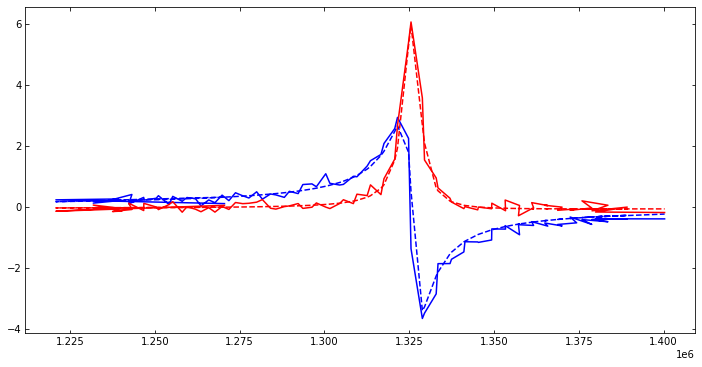

In [49]:
i = np.random.randint(data_test.shape[0])
pred_params = np.array(hls_model.predict(data_test[i]))

pred_params_unscaled = torch.tensor(params_scaler.inverse_transform(np.atleast_2d(pred_params)))
out = SHO_fit_func_torch(pred_params_unscaled, wvec_freq)

%matplotlib inline
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))

axs.plot(wvec_freq, scaler_real.transform(torch.real(out[0])), '--', color='blue')
axs.plot(wvec_freq, scaler_imag.transform(torch.imag(out[0])), '--', color='red')
axs.plot(wvec_freq, data_test[i, :, 0], color='blue')
axs.plot(wvec_freq, data_test[i, :, 1], color='red')

In [50]:
all_pred_params = np.array(hls_model.predict(data_[:, :, :]))

In [56]:
all_pred_params_unscaled = torch.tensor(params_scaler.inverse_transform(np.atleast_2d(all_pred_params)))
out_all = SHO_fit_func_torch(all_pred_params_unscaled, wvec_freq)

In [53]:
out_sho_lsqf = SHO_fit_func_torch(torch.tensor(
                              params[:]), wvec_freq)

In [57]:
magnitude_graph_nn, phase_graph_nn = convert_real_imag(out_all)
magnitude_graph_lsqf, phase_graph_lsqf = convert_real_imag(out_sho_lsqf)

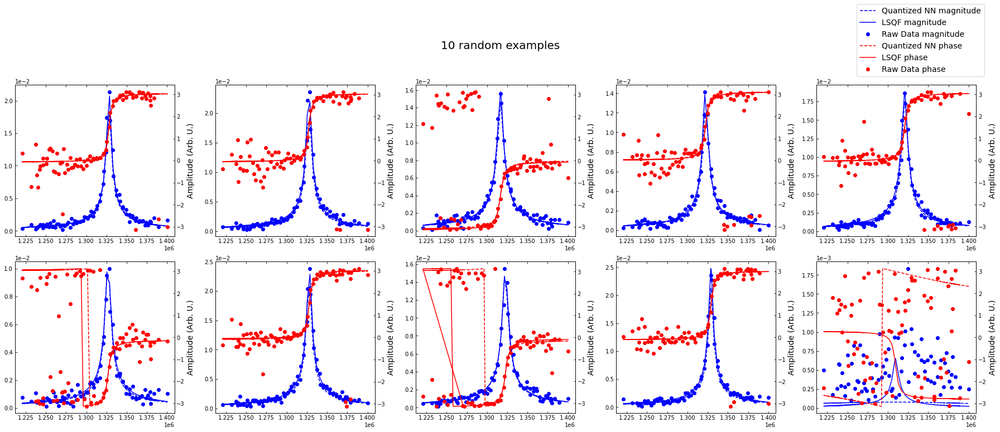

In [60]:
fig, axs = plt.subplots(2, 5, figsize=(25, 10))

fig.suptitle('10 random examples', fontsize=20)

for y in range(5):
  for x in range(2):
    i = np.random.randint(0, out_all.shape[0])
    axs[x, y].plot(wvec_freq, magnitude_graph_nn[i], '--', color='blue', label='Quantized NN magnitude')
    axs[x, y].plot(wvec_freq, magnitude_graph_lsqf[i], color='blue', label='LSQF magnitude')
    axs[x, y].plot(wvec_freq, magnitude_graph_initial[i], 'o', color='blue', label='Raw Data magnitude')
    ax2 = axs[x, y].twinx()
    ax2.plot(wvec_freq, phase_graph_nn[i], '--', color='red', label='Quantized NN phase')
    ax2.plot(wvec_freq, phase_graph_lsqf[i], color='red', label='LSQF phase')
    ax2.plot(wvec_freq, phase_graph_initial[i], 'o', color='red', label='Raw Data phase')

    axs[x, y].ticklabel_format(axis="y", style="sci", scilimits=(0,0))
    ax2.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
    ax2.set(xlabel='Frequency (Hz)', ylabel='Amplitude (Arb. U.)')

    if x == 0 and y == 0:
      lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
      lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]

fig.tight_layout()
plt.legend(lines, labels, bbox_to_anchor=(1.05, 2.7), loc='upper right', borderaxespad=0., prop={'size': 14})
fig.subplots_adjust(top=0.87)

plt.savefig('../../Assets/Figures/10_random_quantized.png')
plt.savefig('../../Assets/Figures/10_random_quantized.svg')

In [61]:
print(f'MSE real (all data): {mean_squared_error(scaler_real.transform(np.real(out_all)), data_[:, :, 0])}')
print(f'MSE imag (all data): {mean_squared_error(scaler_imag.transform(np.imag(out_all)), data_[:, :, 1])}')

MSE real (all data): 0.05370514984687329
MSE imag (all data): 0.05019826914532425


In [73]:
import datetime

sns.reset_orig()
plt.rcParams['image.cmap'] = 'magma'
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True
video_duration = 10
if os.path.exists("../../Assets/Maps/hls_comparison"):
  pass
else:
  os.makedirs("../../Assets/Maps/hls_comparison")
if os.path.exists("../../Assets/Movies"):
  pass
else:
  os.makedirs("../../Assets/Movies")

In [68]:
amp_min = min(params[:, 0])
amp_max = max(params[:, 0])
res_min = min(params[:, 1])
res_max = max(params[:, 1])
qf_min = min(params[:, 2])
qf_max = max(params[:, 2])
ph_min = min(params[:, 3])
ph_max = max(params[:, 3])

mins = [amp_min, res_min, qf_min, ph_min]
maxs = [amp_max, res_max, qf_max, ph_max]

In [69]:
all_pred_params_unscaled_copy = np.array(all_pred_params_unscaled).copy()
params_copy = params.copy()

In [70]:
params_transformed, all_pred_params_transformed = transform_params(params_copy, all_pred_params_unscaled_copy)

In [71]:
units = ['Amplitude (Arb. U.)', 'Frequency (Hz)', 'Quality Factor (Arb. U.)', 'Phase (rad)']

for img_index in range(0, params_transformed[:,0].reshape(num_pix, voltage_steps).shape[1], 2):
    fig, axs = plt.subplots(figsize=(22., 22.))

    axs.axis('off')

    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                  nrows_ncols=(2, 8),
                  cbar_location="right",
                  direction="row",
                  cbar_mode='each',
                  cbar_size="10%",
                  cbar_pad=0.15,
                  axes_pad=0.8,)  # pad between axes in inch.)

    for i in range(0,8,2):

        # initial
        im = grid[i].imshow(params_transformed[:,i//2].reshape(num_pix,voltage_steps)[:, img_index].reshape(num_pix_1d,num_pix_1d), vmin=mins[i//2], vmax=maxs[i//2]);
        grid[i].axes.set_title(units[i//2]+"\nVoltage ON\nNo Noise");
        grid[i].axis("off");
        plt.colorbar(im, cax=grid[i].cax, format='%.0e');
        im = grid[i+1].imshow(params_transformed[:,i//2].reshape(num_pix,voltage_steps)[:, img_index+1].reshape(num_pix_1d,num_pix_1d), vmin=mins[i//2], vmax=maxs[i//2]);
        grid[i+1].axes.set_title(units[i//2]+"\nVoltage Off\nNo Noise");
        grid[i+1].axis("off");
        plt.colorbar(im, cax=grid[i+1].cax, format='%.0e');

        # hls model
        im = grid[i+8].imshow(all_pred_params_transformed[:, i//2].reshape(num_pix, voltage_steps)[:, img_index].reshape(num_pix_1d,num_pix_1d), vmin=mins[i//2], vmax=maxs[i//2]);
        if i == 0:
            grid[i+8].axes.set_title("HLS Model");
        grid[i+8].axis("off");
        plt.colorbar(im, cax=grid[i+8].cax, format='%.0e');
        im = grid[i+9].imshow(all_pred_params_transformed[:, i//2].reshape(num_pix, voltage_steps)[:, img_index+1].reshape(num_pix_1d,num_pix_1d), vmin=mins[i//2], vmax=maxs[i//2]);
        grid[i+9].axis("off");
        plt.colorbar(im, cax=grid[i+9].cax, format='%.0e');
        
    plt.tight_layout();
    plt.savefig('../../Assets/Maps/hls_comparison/' + str((int)(datetime.datetime.now().timestamp())) + '.png', dpi=150);
    plt.close(fig)

In [74]:
make_movie('hls_comparison_movie', '../../Assets/Maps/hls_comparison/', '../../Assets/Movies', file_format='png', fps=4)
amplitude_clip = VideoFileClip('../../Assets/Movies/hls_comparison_movie.mp4')
amplitude_clip = amplitude_clip.set_duration(20)

t:   1%|▋                                                                     | 2/192 [07:36<00:14, 13.44it/s, now=None]

Moviepy - Building video ../../Assets/Movies/hls_comparison_movie.mp4.
Moviepy - Writing video ../../Assets/Movies/hls_comparison_movie.mp4




t:   1%|▋                                                                     | 2/192 [08:40<00:14, 13.44it/s, now=None]

Moviepy - Done !
Moviepy - video ready ../../Assets/Movies/hls_comparison_movie.mp4


In [75]:
amplitude_clip.ipython_display(width = 540)

t:   1%|▋                                                                     | 2/192 [11:19<00:14, 13.44it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4




t:   1%|▋                                                                     | 2/192 [11:23<00:14, 13.44it/s, now=None]

Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Saving results into the PyUSID File

In [77]:
all_pred_params_reshaped = np.reshape(all_pred_params_transformed, (num_pix, voltage_steps, -1))

In [78]:
amp = np.array(all_pred_params_reshaped[:, :, 0], dtype=[('Amplitude', 'float32')])
res = np.array(all_pred_params_reshaped[:, :, 1], dtype=[('Resonance', 'float32')])
qfc = np.array(all_pred_params_reshaped[:, :, 2], dtype=[('Q-Factor', 'float32')])
ph = np.array(all_pred_params_reshaped[:, :, 3], dtype=[('Phase', 'float32')])

In [79]:
params_list = rfn.merge_arrays((amp, res, qfc, ph), flatten = True, usemask = False)
params_list = params_list.reshape((num_pix, voltage_steps))

In [80]:
h5_results_grp = create_results_group(h5_f['Measurement_000']['Channel_000']['Raw_Data'], 'Predictions', h5_parent_group=h5_f['Measurement_000']['Channel_000'])

pos_sizes = [num_pix_1d, num_pix_1d]
pos_names = ['X', 'Y']
pos_units = ['nm', 'um']
pos_dims = []
for length, name, units in zip(pos_sizes, pos_names, pos_units):
    pos_dims.append(Dimension(name, units, np.arange(length)))

spec_sizes = [voltage_steps]
spec_names = ['Cycle']
spec_units = ['V']
spec_dims = []
for length, name, units in zip(spec_sizes, spec_names, spec_units):
    spec_dims.append(Dimension(name, units, np.arange(length)))

In [81]:
write_main_dataset(h5_results_grp,
                    params_list, 'SHO-Pred-Results', 
                    '(Amplitude, Resonance, Q-Factor, Phase)', 
                    '(Arb. U., Frequency (Hz), Arb. U., rad)',
                    pos_dims, spec_dims)

  warn('main_data_name should not contain the "-" character. Reformatted name from:{} to '

  warn('In the future write_ind_val_dsets will default to requiring dimensions to be arranged from slowest to fastest varying')

  warn('pyUSID.io.hdf_utils.simple.write_ind_val_dsets no longer creates'



<HDF5 dataset "SHO_Pred_Results": shape (3600, 384), type "|V16">
located at: 
	/Measurement_000/Channel_000/Raw_Data-Predictions_000/SHO_Pred_Results 
Data contains: 
	(Amplitude, Resonance, Q-Factor, Phase) ((Arb. U., Frequency (Hz), Arb. U., rad)) 
Data dimensions and original shape: 
Position Dimensions: 
	Y - size: 60 
	X - size: 60 
Spectroscopic Dimensions: 
	Cycle - size: 384
Data Fields:
	Amplitude, Resonance, Q-Factor, Phase

In [82]:
usid.hdf_utils.print_tree(h5_f)

/
├ Measurement_000
  ---------------
  ├ Channel_000
    -----------
    ├ Bin_FFT
    ├ Bin_Frequencies
    ├ Bin_Indices
    ├ Bin_Step
    ├ Bin_Wfm_Type
    ├ Excitation_Waveform
    ├ Noise_Floor
    ├ Position_Indices
    ├ Position_Values
    ├ Raw_Data
    ├ Raw_Data-Predictions_000
      ------------------------
      ├ Position_Indices
      ├ Position_Values
      ├ SHO_Pred_Results
      ├ Spectroscopic_Indices
      ├ Spectroscopic_Values
    ├ Raw_Data-SHO_Fit_000
      --------------------
      ├ Fit
      ├ Guess
      ├ Spectroscopic_Indices
      ├ Spectroscopic_Values
      ├ completed_fit_positions
      ├ completed_guess_positions
    ├ Spatially_Averaged_Plot_Group_000
      ---------------------------------
      ├ Bin_Frequencies
      ├ Max_Response
      ├ Mean_Spectrogram
      ├ Min_Response
      ├ Spectroscopic_Parameter
      ├ Step_Averaged_Response
    ├ Spatially_Averaged_Plot_Group_001
      ---------------------------------
      ├ Bin_Frequencies


### Model Synthesis & Export

In [ ]:
hls_model.build(csim=True, synth=True, vsynth=True, export=True)

### Synthesis Report

In [ ]:
hls4ml.report.read_vivado_report('[name]')